# Custom Training with YOLOv5

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output 

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14419, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 14419 (delta 14), reused 21 (delta 10), pack-reused 14379
Receiving objects: 100% (14419/14419), 13.34 MiB | 15.88 MiB/s, done.
Resolving deltas: 100% (9965/9965), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 4.7 MB/s 
     |████████████████████████████████| 145 kB 9.3 MB/s 
     |████████████████████████████████| 178 kB 64.5 MB/s 
     |████████████████████████████████| 67 kB 6.2 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 138 kB 68.3 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


# Step 2: Assemble Our Dataset
Created the dataset with help of Roboflow 
Roboflow basically store and organize the image dataset and create a yaml file which can be direclty passed to yolov5 model

In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
# This api is what we got from the roboflow dataset 
from roboflow import Roboflow
rf = Roboflow(api_key="5q1YVR6OwqPWMnicHksk")
project = rf.workspace("license-x4xlz").project("alpr-bfdif")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/ALPR-1 in yolov5pytorch:: 100%|██████████| 612/612 [00:00<00:00, 1417.15it/s]


# Step 3: Train Our Custom YOLOv5 model
Arguments:
*   img:define input image size
*   batch:determine batch size
*   epochs:define the number of training epochs. 
*   data: Our dataset locaiton is saved in the dataset.location
*   weights: specify a path to weights to start transfer learning from. 
*   cache: cache images for faster training


In [5]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/ALPR-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-208-g8236d88 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015,

# Evaluate Custom YOLOv5 Detector Performance

In [8]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights


In [6]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/ALPR-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-208-g8236d88 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/29 /content/datasets/ALPR-1/test/images/Cars141_png.rf.096bdd52f62e49e4b217e19014683351.jpg: 416x416 2 licences, 8.3ms
image 2/29 /content/datasets/ALPR-1/test/images/Cars143_png.rf.2a0c94284d08d427e8c3513612ccc0d6.jpg: 416x416 2 licences, 9.0ms
image 3/29 /content/datasets/ALPR-1/test/images/Cars16_png.rf.c967bdd927d546

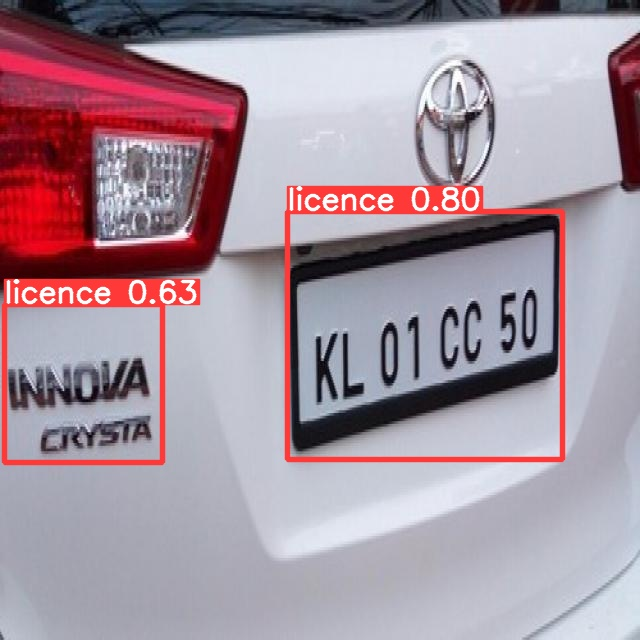

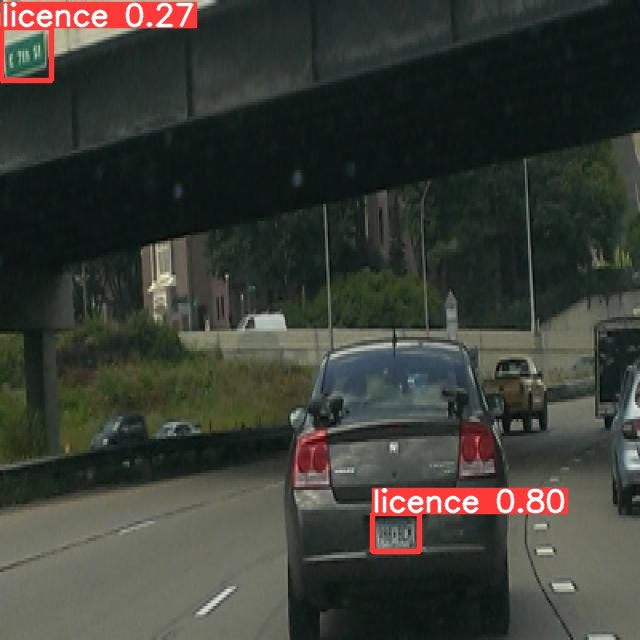

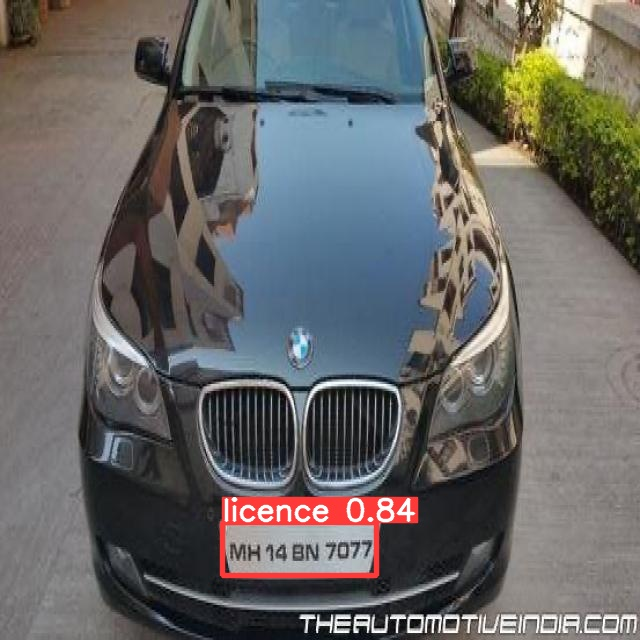

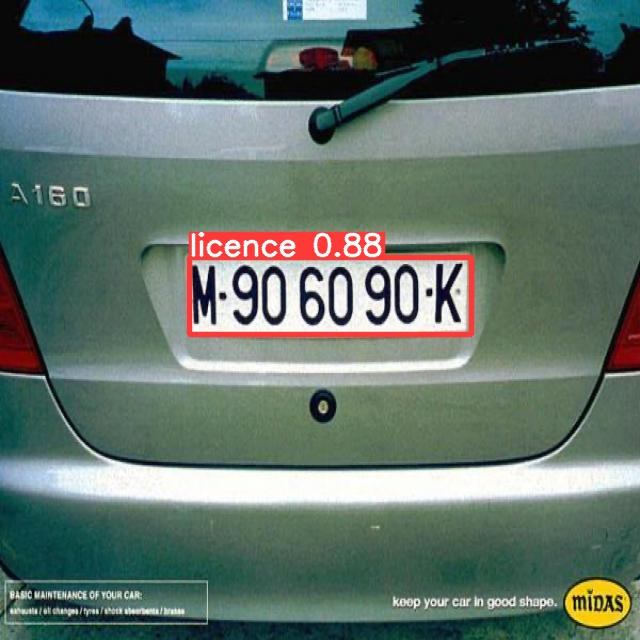

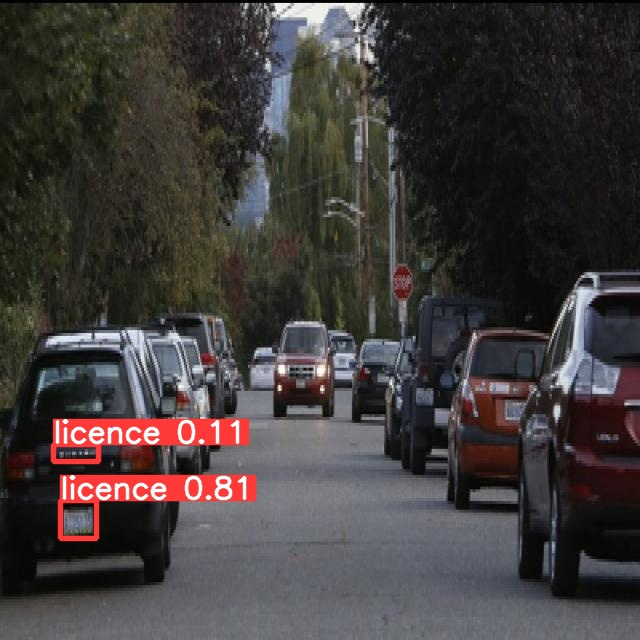

...

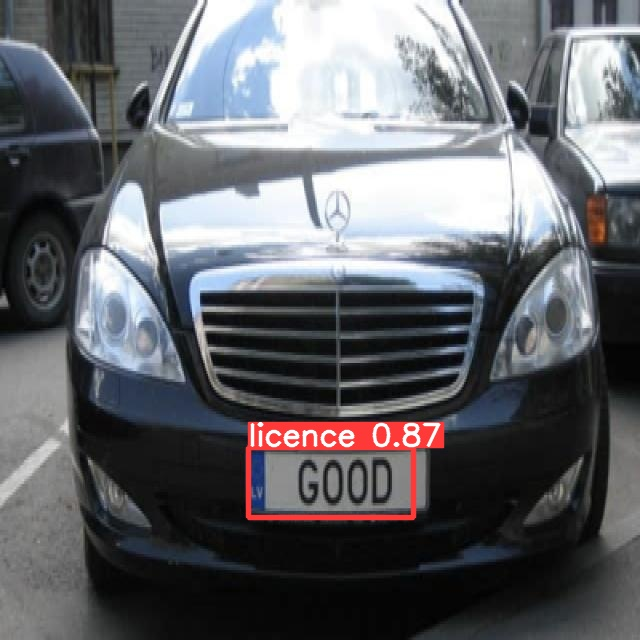

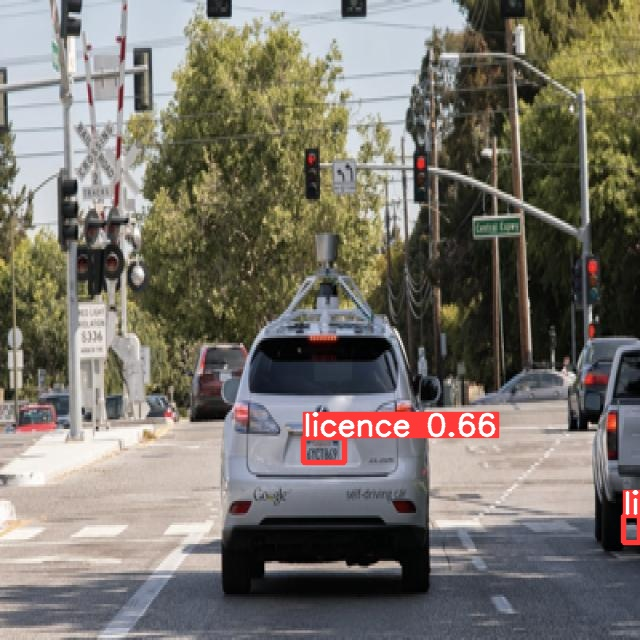

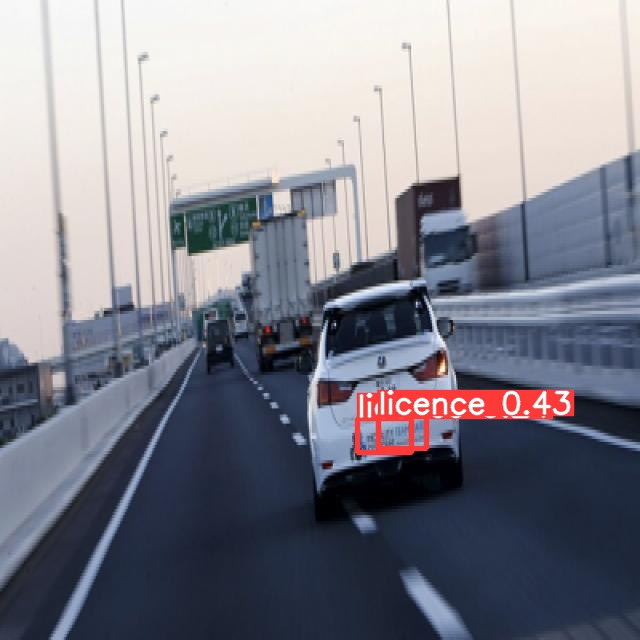

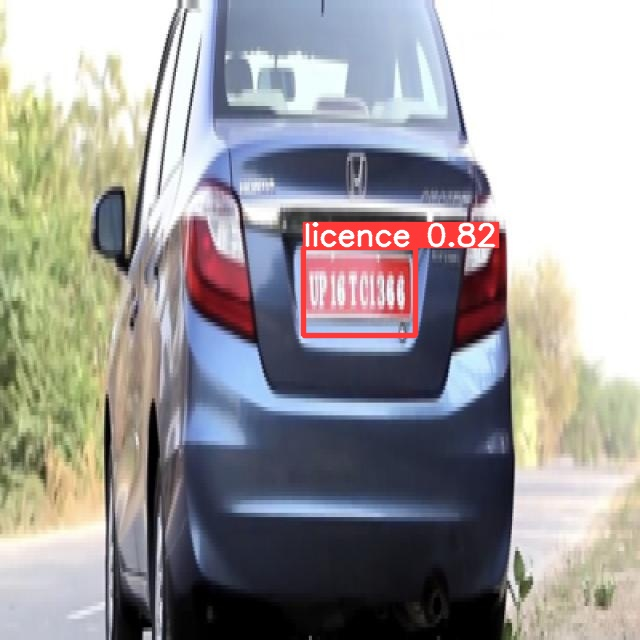

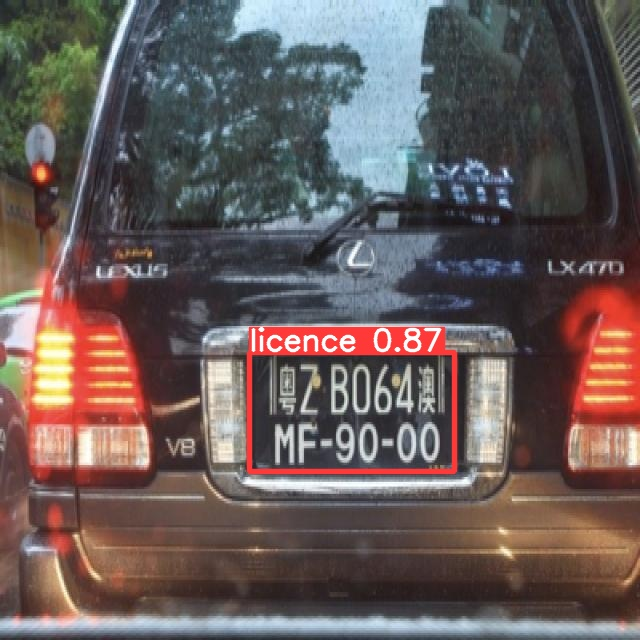

In [7]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#Exporting the model weights

In [9]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>